In [1]:
%load_ext autoreload
%autoreload 2

%matplotlib inline

In [2]:
from datetime import datetime, timedelta
import gc
import numpy as np, pandas as pd
import lightgbm as lgb
from pathlib import Path
from scipy import stats
import re

In [3]:
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from matplotlib.animation import FuncAnimation
import seaborn as sns

In [4]:
path=Path('/models/covid19')
assert path.exists()

In [5]:
# !ls /home/gilf/'COVID-19 Cases (2).csv'

In [6]:
!mv /home/gilf/'COVID-19 Cases (3).csv' {path/'covid_19_cases.csv'}

In [7]:
!ls -la {path/'covid_19_cases.csv'}

-rw-rw-r-- 1 gilf gilf 176170433 May 18 18:26 /models/covid19/covid_19_cases.csv


In [8]:
date = 'Date'
country_region = 'Country_Region'
case_type = 'Case_Type'
people_total_tested_count = 'People_Total_Tested_Count'
confirmed = 'Confirmed'
deaths = 'Deaths'
daily_new_cases = 'daily_new_cases'
people_hospitalized_cumulative_count = 'People_Hospitalized_Cumulative_Count'
cases = 'Cases'

### Data Overview

The data in this notebook comes from https://data.world/datasets/covid-19. The data is updated daily.

In [9]:
df = pd.read_csv(path/'covid_19_cases.csv', low_memory=False)

#### Employment Data

In [10]:
df_unemployment = pd.read_csv('/kaggle/m5_forecasting/unemployment_us.csv')

In [11]:
df_unemployment_months = {c: i for i, c in enumerate(df_unemployment.columns) if i > 0}
df_unemployment_months

{'Jan': 1,
 'Feb': 2,
 'Mar': 3,
 'Apr': 4,
 'May': 5,
 'Jun': 6,
 'Jul': 7,
 'Aug': 8,
 'Sep': 9,
 'Oct': 10,
 'Nov': 11,
 'Dec': 12}

In [12]:
# pd.pivot_table(df_grouped, values = ['sum'], index=[date,country_region], columns = case_type).reset_index()
df_unemployment = pd.melt(df_unemployment,
                  id_vars = ['Year'],
                  value_vars =[c for c in df_unemployment.columns if c != 'Year'],
                  var_name = "month",
                  value_name = "unemployment_rate")

In [13]:
df_unemployment.replace({'month': df_unemployment_months}, inplace=True)

In [14]:
df_unemployment['date'] = df_unemployment[['Year', 'month']].apply(lambda x : datetime(x['Year'], int(x['month']), 1), axis=1)

In [15]:
df_unemployment.sort_values(['date'], inplace=True)

In [16]:
df_unemployment.set_index('date', inplace=True)

In [17]:
df_unemployment = df_unemployment.asfreq('D', method='pad',)

In [18]:
df_unemployment['unemployment_rate'].replace(' ', np.nan, inplace=True)

In [19]:
df_unemployment.dropna(inplace=True)

In [20]:
df_unemployment['unemployment_rate'] = df_unemployment['unemployment_rate'].astype('float16')

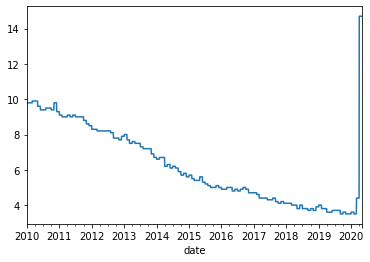

In [21]:
df_unemployment.unemployment_rate.plot()

In [22]:
pd.options.display.max_columns = 50
pd.options.mode.chained_assignment = None
# plt.style.use('fivethirtyeight')

In [23]:
df

,Case_Type,People_Total_Tested_Count,Cases,Difference,Date,Combined_Key,Country_Region,Province_State,Admin2,iso2,iso3,FIPS,Lat,Long,Population_Count,People_Hospitalized_Cumulative_Count,Data_Source,Prep_Flow_Runtime
0,Confirmed,NaN,0,0,2/3/2020,Switzerland,Switzerland,NaN,NaN,CH,CHE,NaN,46.818200,8.227500,8654618.0,NaN,2019 Novel Coronavirus COVID-19 (2019-nCoV) Da...,5/17/2020 11:31:55 PM
1,Confirmed,NaN,23,0,4/21/2020,Antigua and Barbuda,Antigua and Barbuda,NaN,NaN,AG,ATG,NaN,17.060800,-61.796400,97928.0,NaN,2019 Novel Coronavirus COVID-19 (2019-nCoV) Da...,5/17/2020 11:31:55 PM
2,Deaths,NaN,0,0,3/1/2020,Cyprus,Cyprus,NaN,NaN,CY,CYP,NaN,35.126400,33.429900,1207361.0,NaN,2019 Novel Coronavirus COVID-19 (2019-nCoV) Da...,5/17/2020 11:31:55 PM
3,Deaths,NaN,56,0,5/11/2020,Thailand,Thailand,NaN,NaN,TH,THA,NaN,15.870032,100.992541,69799978.0,NaN,2019 Novel Coronavirus COVID-19 (2019-nCoV) Da...,5/17/2020 11:31:55 PM
4,Deaths,NaN,0,0,2/11/2020,Jamaica,Jamaica,NaN,NaN,JM,JAM,NaN,18.109600,-77.297500,2961161.0,NaN,2019 Novel Coronavirus COVID-19 (2019-nCoV) Da...,5/17/2020 11:31:55 PM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
823909,Confirmed,NaN,0,0,1/22/2020,"Traill, North Dakota, US",US,North Dakota,Traill,US,USA,38097.0,47.453678,-97.163233,8036.0,NaN,2019 Novel Coronavirus COVID-19 (2019-nCoV) Da...,5/17/2020 11:31:55 PM
823910,Deaths,NaN,0,0,1/22/2020,Angola,Angola,NaN,NaN,AO,AGO,NaN,-11.202700,17.873900,32866268.0,NaN,2019 Novel Coronavirus COVID-19 (2019-nCoV) Da...,5/17/2020 11:31:55 PM
823911,Deaths,NaN,0,0,1/22/2020,"Loup, Nebraska, US",US,Nebraska,Loup,US,USA,31115.0,41.913720,-99.454404,664.0,NaN,2019 Novel Coronavirus COVID-19 (2019-nCoV) Da...,5/17/2020 11:31:55 PM
823912,Deaths,NaN,0,0,1/22/2020,"Mercer, North Dakota, US",US,North Dakota,Mercer,US,USA,38057.0,47.312131,-101.831840,8187.0,NaN,2019 Novel Coronavirus COVID-19 (2019-nCoV) Da...,5/17/2020 11:31:55 PM


In [24]:
countries = df[country_region].unique()

There are **187** countries in this data set

In [25]:
country_list = list(countries)
country_list.sort()
country_data = [{'id': e[0], 'country': e[1]} for e in enumerate(country_list)]
pd.DataFrame(country_data).set_index('id')

,country
id,
0,Afghanistan
1,Albania
2,Algeria
3,Andorra
4,Angola
...,...
182,West Bank and Gaza
183,Western Sahara
184,Yemen


Here are all types of cases:

In [26]:
case_types = df[case_type].unique()
", ".join(list(case_types))

'Confirmed, Deaths'

It seems that only the US has hospitalized people

In [27]:
list(df[df[people_hospitalized_cumulative_count] > 0][country_region].unique())

['US']

Changing the date format and check the date range

In [28]:
df[date] = pd.to_datetime(df[date], infer_datetime_format=True)

In [29]:
df_grouped = df.groupby([date, country_region, case_type])[cases].aggregate(['sum']).reset_index()

In [30]:
df_grouped

,Date,Country_Region,Case_Type,sum
0,2020-01-22,Afghanistan,Confirmed,0
1,2020-01-22,Afghanistan,Deaths,0
2,2020-01-22,Albania,Confirmed,0
3,2020-01-22,Albania,Deaths,0
4,2020-01-22,Algeria,Confirmed,0
...,...,...,...,...
43753,2020-05-17,Yemen,Deaths,20
43754,2020-05-17,Zambia,Confirmed,753
43755,2020-05-17,Zambia,Deaths,7
43756,2020-05-17,Zimbabwe,Confirmed,44


In [31]:
df_grouped = pd.pivot_table(df_grouped, values = ['sum'], index=[date,country_region], columns = case_type).reset_index()

In [32]:
df_grouped.columns = [date, country_region, confirmed, deaths]

In [33]:
df_grouped.sort_values(date, inplace=True)

In [34]:
df_grouped[df_grouped[country_region] == 'US']

,Date,Country_Region,Confirmed,Deaths
173,2020-01-22,US,1,0
360,2020-01-23,US,1,0
547,2020-01-24,US,2,0
734,2020-01-25,US,2,0
921,2020-01-26,US,5,0
...,...,...,...,...
21117,2020-05-13,US,1390254,84116
21304,2020-05-14,US,1417622,85895
21491,2020-05-15,US,1442672,87527
21678,2020-05-16,US,1467668,88751


Checking the beginning and end of the dataset:

In [35]:
df_grouped[date].min(), df_grouped[date].max()

(Timestamp('2020-01-22 00:00:00'), Timestamp('2020-05-17 00:00:00'))

#### Tested people grouping (US only)

In [36]:
df_grouped_tested = df.groupby([date, country_region])[people_total_tested_count].sum().reset_index()

In [37]:
df_grouped_tested[people_total_tested_count] = df_grouped_tested[people_total_tested_count].astype('int32')

In [38]:
df_grouped_tested[df_grouped_tested[people_total_tested_count] > 0]

,Date,Country_Region,People_Total_Tested_Count
15320,2020-04-12,US,5611784
15507,2020-04-13,US,5870012
15694,2020-04-14,US,6163240
15881,2020-04-15,US,6485510
16068,2020-04-16,US,6802128
16255,2020-04-17,US,7082736
16442,2020-04-18,US,7380964
16629,2020-04-19,US,7731728
16816,2020-04-20,US,8007102
17003,2020-04-21,US,8310356


In [39]:
df_grouped = df_grouped.merge(df_grouped_tested, on=[date, country_region], how='left')

In [40]:
assert df_grouped[people_total_tested_count].min() == 0

Unfortunately there are in this dataset only people tested count for the US

In [41]:
list(df_grouped_tested[df_grouped_tested[people_total_tested_count] > 0][country_region].unique())

['US']

### Country Comparisons

Filtering by one specific date

In [42]:
country_map = {c: c if c != 'United Arab Emirates' else 'UAE' for c in df_grouped[country_region].unique()}
assert country_map['United Arab Emirates'] == 'UAE'

In [43]:
df_grouped.replace({country_region: country_map}, inplace=True)

In [44]:
df_grouped_single_date = df_grouped[df_grouped[date] == '2020-05-13']

In [45]:
df_grouped_single_date.sort_values([confirmed], ascending=[False], inplace=True)

In [46]:
df_grouped_single_date

,Date,Country_Region,Confirmed,Deaths,People_Total_Tested_Count
20996,2020-05-13,US,1390254,84116,19949662
20967,2020-05-13,Russia,242271,2212,0
21001,2020-05-13,United Kingdom,230985,33264,0
21029,2020-05-13,Spain,228691,27104,0
21098,2020-05-13,Italy,222104,31106,0
...,...,...,...,...,...
21021,2020-05-13,Seychelles,11,0,0
21032,2020-05-13,Suriname,10,1,0
20955,2020-05-13,Papua New Guinea,8,0,0
21006,2020-05-13,Western Sahara,6,0,0


In [47]:
def generate_color_map():
    unique_countries = df_grouped[country_region].unique()
    country_length = len(unique_countries)
    rand_colors = abs(np.random.random(country_length * 3).reshape(country_length, 3))
    color_map = {country: tuple(color) if country != 'China' else (0.55, 0.10, 0.10) for country, color in zip(unique_countries, rand_colors)}
    return color_map

In [48]:
def calc_bar_plot_data(day):
    df_grouped_single_date = df_grouped[df_grouped[date] == day]
    df_grouped_single_date.sort_values([confirmed], ascending=[False], inplace=True)
    return df_grouped_single_date

def render_bar_plot(day, num_countries = 15, fig=None, axis=None):
    sns.set_context('paper')
    df_grouped_single_date = calc_bar_plot_data(day)
    if fig == None or axis == None:
        f, ax = plt.subplots(figsize = (12,15))
    else:
        f, ax = fig, axis
    
    sns.barplot(x = confirmed, y = country_region, data = df_grouped_single_date[:num_countries],
                label = 'Confirmed Cases', color = 'b', edgecolor = 'w')
    sns.barplot(x = deaths, y = country_region, data = df_grouped_single_date[:num_countries],
                label = 'Confirmed Cases', color = 'c', edgecolor = 'w');

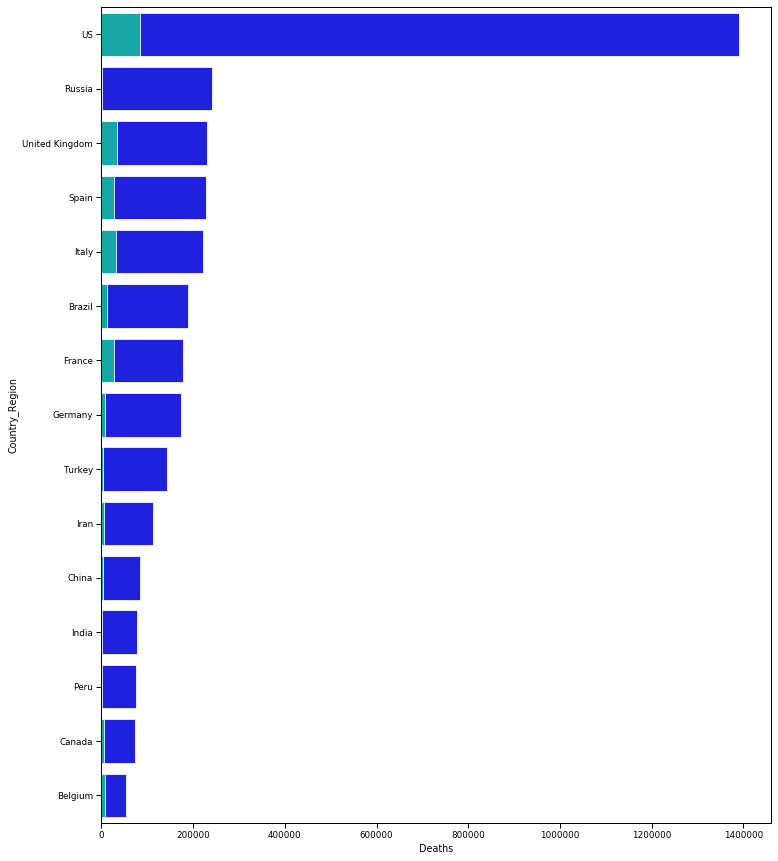

In [49]:
render_bar_plot('2020-05-13')

In [85]:
%%capture
fig, ax = plt.subplots(figsize = (15, 9))

In [51]:
unique_dates = df_grouped[date].unique()

In [52]:
def convert_to_readable_date(date):
    ts = pd.to_datetime(str(date))
    return ts.strftime('%d %B %Y')

convert_to_readable_date(unique_dates[0])

'22 January 2020'

In [53]:
df_grouped_single_date['Confirmed']

20996    1390254
20967     242271
21001     230985
21029     228691
21098     222104
          ...   
21021         11
21032         10
20955          8
21006          6
20969          1
Name: Confirmed, Length: 187, dtype: int64

In [88]:
import matplotlib.style as style

plt.rcParams.update({'font.size': 16})
plt.rc('axes', titlesize=16)     # fontsize of the axes title
plt.rc('axes', labelsize=16)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)

unique_dates = df_grouped[date].unique()
days_in_dataset = len(unique_dates)
color_map = generate_color_map()

def update_bar_plot(num):
    style.use('fivethirtyeight')
    ax.clear()
    df_grouped_single_date = calc_bar_plot_data(unique_dates[num])
    num_countries = 15
    countries = df_grouped_single_date[country_region][:num_countries]
    confirmed_cases = df_grouped_single_date[confirmed][:num_countries]
    death_cases = df_grouped_single_date[deaths][:num_countries]
    colors = [color_map[country] for country in countries]
    title = convert_to_readable_date(unique_dates[num])
    ax.set_title(title)
    for i, v in enumerate(confirmed_cases): # setting the number after the bar
        ax.text(v + 3, i - .18, str(v), color='black')
    h = ax.barh(countries, confirmed_cases, color=colors)
    ax.barh(countries, death_cases, color='r')
    ax.legend(h, countries)

ani = FuncAnimation(fig, update_bar_plot, frames=range(days_in_dataset), repeat=False, interval=750)

from IPython.display import HTML
HTML(ani.to_jshtml())


In [113]:
ani.save('confirmed_barh_covid_19.gif', writer='imagemagick', fps=2)
# ani.save('confirmed_barh_covid_fast_19.gif', writer='imagemagick', fps=4)
# ani.save('confirmed_barh_covid_super_fast_19.gif', writer='imagemagick', fps=4)

In [55]:
def distribution_plot(labels= ['Days with cases', 'Days with no cases'], 
                      percentages=[50, 50],
                     title=""):
    fig, ax = plt.subplots(figsize = (13,7))
    if len(labels) == 2:
        explode=(0.1,0)
        ax.pie(percentages, explode=explode, labels=labels, autopct='%1.0f%%', 
               shadow=False, startangle=0,   
               pctdistance=1.2, labeldistance=1.4)
    else:
        ax.pie(percentages, labels=labels, autopct='%1.0f%%', 
               shadow=False, startangle=0,   
               pctdistance=1.2,labeldistance=1.4)
    ax.axis('equal')
    ax.set_title(title)
    ax.legend(frameon=False, bbox_to_anchor=(0.10, 0.9))


In [56]:
def calc_pct(df):
    return df[confirmed]/df[confirmed].sum() * 100

### Distributions by date

Pie charts are great to check the percentage of cases per country in the world

In [57]:
def single_date_pie(date_str='2020-04-27', num_countries=15):
    df_grouped_single_date = df_grouped[df_grouped[date] == date_str]
    df_grouped_single_date.sort_values([confirmed], ascending=[False], inplace=True)
    df_grouped_single_date_pct = calc_pct(df_grouped_single_date)
    distribution_plot(labels=df_grouped_single_date[country_region][:num_countries], 
                      percentages=df_grouped_single_date_pct[:num_countries],
                      title='Distribution Confirmed Worldwide')

In [58]:
def change_plt_font_size():
    plt.rcParams.update({'font.size': 22})
    diff = 8

    SMALL_SIZE = 8 +  diff
    MEDIUM_SIZE = 10 + diff
    BIGGER_SIZE = 12 + diff

    plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
    plt.rc('axes', titlesize=MEDIUM_SIZE)     # fontsize of the axes title
    plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
    plt.rc('xtick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
    plt.rc('legend', fontsize=MEDIUM_SIZE)    # legend fontsize
    plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

#### 2020-02-01

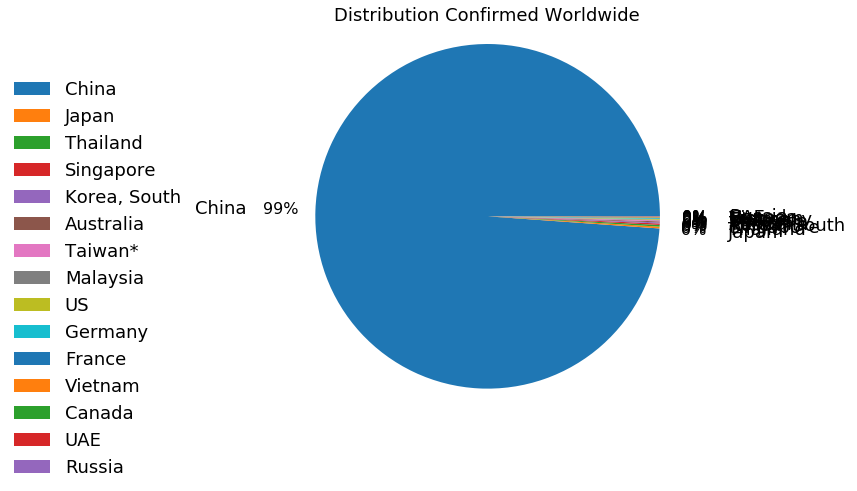

In [59]:
change_plt_font_size()
single_date_pie('2020-02-01')

#### 2020-03-01

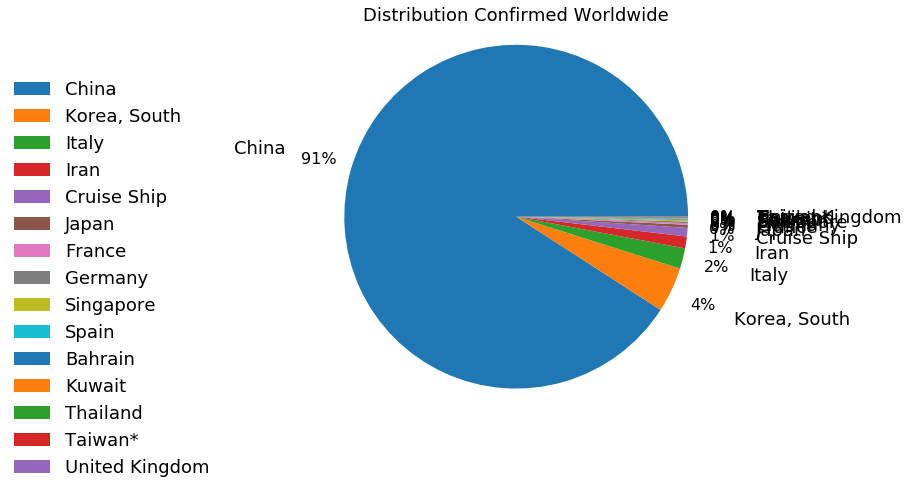

In [60]:
single_date_pie('2020-03-01')

#### 2020-04-01

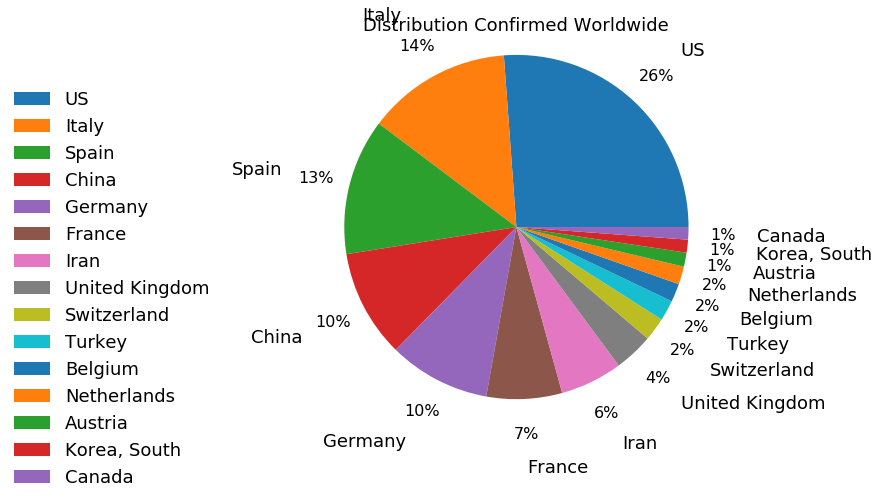

In [61]:
single_date_pie('2020-04-01')

#### 2020-05-09

In [ ]:
single_date_pie('2020-05-09')

In [ ]:
%%capture

def calc_pie_plot_data(increment=0, num_countries=15):
    day = df_grouped[date].min() + timedelta(days=increment)
    df_grouped_single_date = df_grouped[df_grouped[date] == day]
    df_grouped_single_date.sort_values([confirmed], ascending=[False], inplace=True)
    df_grouped_single_date_pct = calc_pct(df_grouped_single_date)
    return df_grouped_single_date[country_region][:num_countries], df_grouped_single_date_pct[:num_countries], day

In [ ]:
labels, percentages, day = calc_pie_plot_data(1)

### Animation of cases over time (pie)

In [ ]:
rc('animation', html='html5')

In [ ]:
change_plt_font_size()

In [ ]:
%%capture
fig, ax = plt.subplots(figsize = (16, 8))

In [ ]:
days_in_dataset = len(df_grouped[date].unique())
color_map = generate_color_map()

def update(num):
    ax.clear()
    ax.axis('equal')
    labels, percentages, day = calc_pie_plot_data(num)
    colors = [color_map[country] for country in labels]
    ax.pie(percentages, labels=labels, colors = colors,
            autopct='%1.0f%%', shadow=False, startangle=0, pctdistance=1.2, labeldistance=1.4)
    
    ax.set_title(f"Confirmed Cases on the {convert_to_readable_date(day)}", loc='left')
    ax.legend(frameon=False, bbox_to_anchor=(0.10, 0.9))

ani = FuncAnimation(fig, update, frames=range(days_in_dataset), repeat=False, interval=750)

from IPython.display import HTML
HTML(ani.to_jshtml())


In [ ]:
ani.save('condirmed_cases_covid_19.gif', writer='imagemagick', fps=2)
ani.save('condirmed_cases_covid_fast_19.gif', writer='imagemagick', fps=4)
ani.save('condirmed_cases_covid_super_fast_19.gif', writer='imagemagick', fps=4)

### Focus on single country
Here we create a filtered data set for one single country

In [ ]:
country = 'United Kingdom'

In [ ]:
df_country = df_grouped[df_grouped[country_region] == country]

In [ ]:
%%capture

fig, ax = plt.subplots(figsize = (10,7));

In [ ]:
timestamps = [df_grouped[date].min() + timedelta(days=i) for i in range(len(df_country))]
t = range(len(timestamps))

ax.axis([0,len(timestamps),0, df_country[confirmed].max()]);
ax.set_title(f'Confirmed in {country}')
l, = ax.plot([],[]);

def animate(i):
    confirmed_list = list(df_country[df_country[date].isin(timestamps[:i])][confirmed])
    l.set_data(t[:i], confirmed_list)

ani = FuncAnimation(fig, animate, frames=len(t));

from IPython.display import HTML
HTML(ani.to_jshtml())

In [ ]:
# Sorting by date
df_country.sort_values([date], inplace=True)

In [ ]:
# Confirmed minus Deaths
df_country['active_cases'] = df_country[confirmed] - df_country[deaths]

In [ ]:
def display_plots(df, fields):
    # Get current size
    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 8
    fig_size[1] = 5
    fig, ax = plt.subplots(dpi=80)
    plt.xticks(rotation=45)
    for f in fields:
        ax.plot(df[date], df[f], label=f)
    ax.legend();
    ax.set_title(f'{fields} in {country}')

display_plots(df_country, [confirmed])
display_plots(df_country, [deaths])
if country == 'US':
    display_plots(df_country, ['People_Total_Tested_Count'])
display_plots(df_country, [confirmed, deaths, 'active_cases'])
if country == 'US':
    display_plots(df_country, [confirmed, deaths, 'People_Total_Tested_Count'])

In [ ]:
df_country['Cases_Previous_Day'] = df_country[[date, confirmed]].sort_values(date)[confirmed].shift(1)

## Daily Cases

In [ ]:
df_country['Cases_Previous_Day'] = df_country[[date, confirmed]].sort_values(date)[confirmed].shift(1)
df_country[daily_new_cases] = df_country.sort_values(date)[confirmed] - df_country.sort_values(date)['Cases_Previous_Day']

In [ ]:
df_country['Deaths_Previous_Day'] = df_country[[date, deaths]].sort_values(date)[deaths].shift(1)
df_country['Daily_New_Deaths'] = df_country.sort_values(date)[deaths] - df_country.sort_values(date)['Deaths_Previous_Day']

In [ ]:
display_plots(df_country, [daily_new_cases])
display_plots(df_country, ['Daily_New_Deaths'])
display_plots(df_country, [daily_new_cases, 'Daily_New_Deaths'])

### Trying to recognize trends

Here we are trying to recognize the trend with running averages

In [ ]:
period = 7
df_country['Weekly_New_Cases_Avg'] = df_country[daily_new_cases].transform(lambda x : x.rolling(period).mean())
df_country['Weekly_New_Cases_Std'] = df_country[daily_new_cases].transform(lambda x : x.rolling(period).std())

In [ ]:
period = 15
df_country['Bi_Weekly_New_Cases_Avg'] = df_country[daily_new_cases].transform(lambda x : x.rolling(period).mean())
df_country['Bi_Weekly_New_Cases_Std'] = df_country[daily_new_cases].transform(lambda x : x.rolling(period).std())

In [ ]:
df_country['Bi_Weekly_New_Cases_EMA'] = df_country[daily_new_cases].transform(lambda x : x.ewm(span=period, adjust=False).mean())

In [ ]:
weekly_view = [daily_new_cases, 'Weekly_New_Cases_Avg', 'Weekly_New_Cases_Std']
by_weekly_view = [daily_new_cases, 'Bi_Weekly_New_Cases_Avg', 'Bi_Weekly_New_Cases_Std']
display_plots(df_country, weekly_view)
display_plots(df_country, by_weekly_view)
display_plots(df_country, weekly_view + by_weekly_view)

In [ ]:
by_weekly_ema_view = [daily_new_cases, 'Bi_Weekly_New_Cases_EMA']
display_plots(df_country, by_weekly_ema_view)

### Simple Distributions

In [ ]:
list(df_country.columns)

In [ ]:
days_with_cases = len(df_country[df_country[daily_new_cases] > 0])
days_with_no_cases = len(df_country[df_country[daily_new_cases] == 0])

In [ ]:
distribution_plot(['Days with cases', 'Days with no cases'], [days_with_cases, days_with_no_cases], 
                  "Days with cases vs no cases")

## Outliers

In [ ]:
df_country_daily_new_cases = df_country[df_country[daily_new_cases] > 0][[date, daily_new_cases]]

In [ ]:
display_plots(df_country_daily_new_cases, [daily_new_cases])

In [ ]:
df_country_daily_new_cases['Daily_New_Cases_zscore'] = stats.zscore(df_country_daily_new_cases[daily_new_cases])

In [ ]:
df_country[daily_new_cases].mean(), df_country[daily_new_cases].std()

In [ ]:
def plot_outliers(level=2):
    country_outliers = df_country_daily_new_cases[
        np.abs(df_country_daily_new_cases['Daily_New_Cases_zscore']) > level][[date, daily_new_cases, 'Daily_New_Cases_zscore']]
    distribution_plot(['No outliers', 'outliers'], 
                  [len(df_country_daily_new_cases) - len(country_outliers), len(country_outliers)],
                 "Outliers vs no outliers")
    return country_outliers

In [ ]:
plot_outliers(2)

In [ ]:
plot_outliers(3)